## 1. 统计数据集中各类别的样本个数

In [6]:
import numpy as np
import os
root_path = '/store/dataset/rubbish_yolo'
filename = os.path.join(root_path, 'classes.names')

def load_class(filename):
    with open(filename,'r') as f:
        classes_names = np.loadtxt(f, np.str)
    classes_names = [classes_name.strip() for classes_name in classes_names]
    return classes_names

class_names = load_class(filename)

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

def cal_classnum(filename):
    traintxt = filename

    with open(traintxt,'r') as f:
        trainpaths = np.loadtxt(f, np.str)

    trainpaths = [trainpath.strip() for trainpath in trainpaths]

    annopaths = [trainpath.replace('images', 'labels').replace('jpg','txt') for trainpath in trainpaths]

    annos = np.zeros([0,5])

    for annopath in annopaths:
        with open(annopath, 'r') as f:
            lines = f.readlines()
            obj_annos = [line.strip().split(' ') for line in lines]
            obj_annos = np.array(obj_annos).astype(np.float)
            annos = np.concatenate((annos, obj_annos), axis=0)
            
    y = np.arange(len(class_names))
    for i in range(len(class_names)):
        y[i] = (annos[:,0] == i).sum()
        #print("{}:{}".format(class_names[i], y[i]))
    return y

print("=================train================")
print(class_names)
y_train = cal_classnum(os.path.join(root_path, './train.txt'))
x = np.arange(len(class_names))
plt.bar(x,y_train)
plt.show()

print("=================val===============")
y_val = cal_classnum(os.path.join(root_path, './valid.txt'))
x = np.arange(len(class_names))
plt.bar(x,y_val)
plt.show()

### 1.1 展示某个类别的图片

223


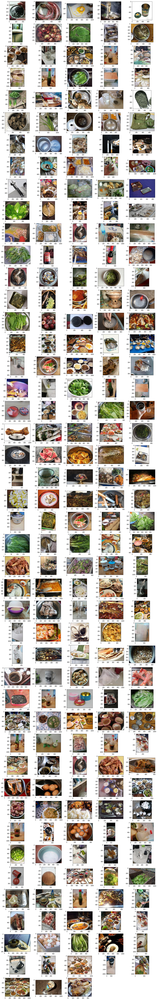

In [6]:
import os
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import math
root_path = '/store/dataset/rubbish_yolo'
def show_images_based_cls(filename, cls):
    with open(filename, 'r') as f:
        filepaths = np.loadtxt(f, np.str)
    filepaths = [filepath.strip() for filepath in filepaths]
    annopaths = [filepath.replace('images', 'labels').replace('jpg','txt') for filepath in filepaths]
    #annos = np.zeros([0,5])
    
    clsfilepaths = []
    for ind, annopath in enumerate(annopaths):
        with open(annopath, 'r') as f:
            lines = f.readlines()
            obj_annos = [line.strip().split(' ') for line in lines]
            obj_annos = np.array(obj_annos).astype(np.float)
            #annos = np.concatenate((annos, obj_annos), axis=0)
        if cls in obj_annos[:, 0]:
            clsfilepaths.append(filepaths[ind])
    return clsfilepaths

cls = 36

filepaths1 = show_images_based_cls(os.path.join(root_path, 'train.txt'), cls)

##
print(len(filepaths1))



row_num = math.ceil(len(filepaths1) / 5)

## 20 : 4 X 5
plt.figure(figsize=(20, row_num * 3))
for ind, filepath in enumerate(filepaths1):
    img = Image.open(filepath)
    
    plt.subplot(row_num, 5, ind+1)
    plt.imshow(img)
    
#plt.show()
filename = 'train_images_cls_%d.png'%cls
plt.savefig(filename)


In [4]:
cls = 27
filename = 'train_images_cls_%d.png'%cls
print(filename)

train_images_cls_27.png


### 2. 统计不同类别的bbox大小

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

def stat_crange(filename):
    traintxt = filename

    with open(traintxt,'r') as f:
        trainpaths = np.loadtxt(f, np.str)

    trainpaths = [trainpath.strip() for trainpath in trainpaths]

    annopaths = [trainpath.replace('images', 'labels').replace('jpg','txt') for trainpath in trainpaths]

    annos = np.zeros([0,5])

    for annopath in annopaths:
        with open(annopath, 'r') as f:
            lines = f.readlines()
            obj_annos = [line.strip().split(' ') for line in lines]
            obj_annos = np.array(obj_annos).astype(np.float)
            annos = np.concatenate((annos, obj_annos), axis=0)
    
    plt.figure(figsize=(12,20))
    for i in range(len(class_names)):
        
        plt.subplot(11,4,i+1)
        
        ind = (annos[:,0] == i)
        w = annos[ind,3]
        h = annos[ind,4]
        plt.scatter(w,h, marker='x', color='red')
        plt.title(class_names[i])
    plt.show()

stat_crange(os.path.join(root_path, 'train.txt'))


### 3. 小/中/大目标 : small (<10%)/ medium(<30%)/ large(>30%) object

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

def stat_crange(filename):
    traintxt = filename

    with open(traintxt,'r') as f:
        trainpaths = np.loadtxt(f, np.str)

    trainpaths = [trainpath.strip() for trainpath in trainpaths]

    annopaths = [trainpath.replace('images', 'labels').replace('jpg','txt') for trainpath in trainpaths]

    annos = np.zeros([0,6])

    for img_ind, annopath in enumerate(annopaths):
        #print(img_ind)
        with open(annopath, 'r') as f:
            lines = f.readlines()
            obj_annos = [line.strip().split(' ') for line in lines]
            obj_annos = np.array(obj_annos).astype(np.float)
            obj_annos = np.concatenate((obj_annos, np.ones([obj_annos.shape[0],1])*img_ind), axis=1)
            annos = np.concatenate((annos, obj_annos), axis=0)
    
    b = np.ones(annos.shape[0])
    annos = np.concatenate((annos, b[:,np.newaxis]), axis = 1)
    print(annos.shape)
    return annos
annos = stat_crange('./train.txt')

1. anno attr: [obj_class, xywh, img_index, w*h(area)]

### 4. Object Ratio

In [ ]:
### annos object index 0~43
import numpy as np
annos[:, -1] = annos[:, 3] * annos[:, 4]

print((annos[:,-1]<0.1).sum() / annos.shape[0])
print(((annos[:,-1]<0.3) & (annos[:,-1]>0.1)).sum()/ annos.shape[0])
print((annos[:,-1]>0.3).sum()/annos.shape[0])

annos_small = annos[annos[:,-1]<0.1]
x = np.arange(44)
y_small = np.zeros(44)
for ind in range(annos_small.shape[0]):
    y_small[int(annos_small[ind, 0])]+=1

annos_m = annos[((annos[:,-1]<0.3) & (annos[:,-1]>0.1))]
x = np.arange(44)
y_m = np.zeros(44)
for ind in range(annos_m.shape[0]):
    y_m[int(annos_m[ind, 0])]+=1


annos_l = annos[annos[:,-1]>0.3]
x = np.arange(44)
y_l = np.zeros(44)
for ind in range(annos_l.shape[0]):
    y_l[int(annos_l[ind, 0])]+=1

    

plt.bar(x,y_small, color='red')
plt.show()
plt.bar(x,y_m, color='green')
plt.show()
plt.bar(x,y_l, color='blue')
plt.show()

## 5. Image Ratio

In [ ]:
print("图像中出现不同大小物体的概率:")
print("图像个数:", annos[:,-2].max())
print("图像中有小物体的比例:", np.unique(annos_small[:,-2]).shape[0]/annos[:,-2].max())
print("图像中有中物体的比例:", np.unique(annos_m[:,-2]).shape[0]/annos[:,-2].max())
print("图像中有大物体的比例:", np.unique(annos_l[:,-2]).shape[0]/annos[:,-2].max())